### First, let's import all of the basics

In [75]:
%matplotlib inline
from __future__ import division

import numpy as np
import matplotlib.pyplot as plt
import sklearn

import scipy.io.wavfile as wavfile
import scipy.signal as sig

from IPython.display import Audio

### Now we import the data

In [73]:
data_root = "data/"
filename = "locknkey.wav"
path = data_root + filename

fs, data = wavfile.read(path)
P = np.mean(data**2)

### Let's look at the data a bit

sampling rate: 48000/sec
data length: 17 sec
power: 3199.38400328


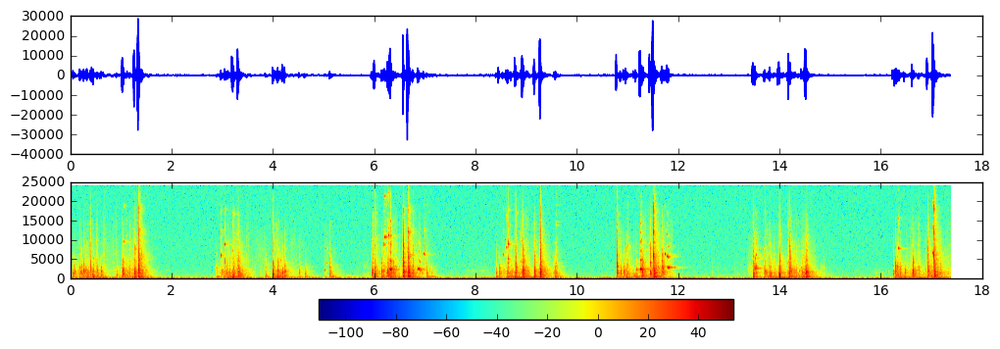

In [76]:
ln = len(data)

print "sampling rate: {}/sec".format(fs)
print "data length: {} sec".format(ln//fs)
print "power: {}".format(P)

def plot_audio(x, fs=fs):
    
    ln = len(x)
    t = np.arange(ln)/fs
    
    plt.figure(figsize=(12,4))
    
    plt.subplot(2,1,1)
    plt.plot(t, x)
    
    plt.subplot(2,1,2)
    plt.specgram(x, Fs=fs, cmap="jet")
    plt.colorbar(orientation='horizontal')
    
plot_audio(data)

Audio(path)

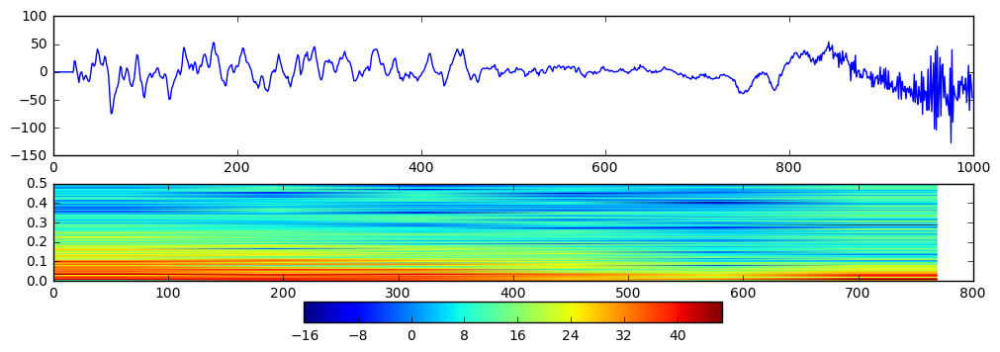

In [55]:
plot_audio(data[:fs//16], fs=1)

### with additive white noise

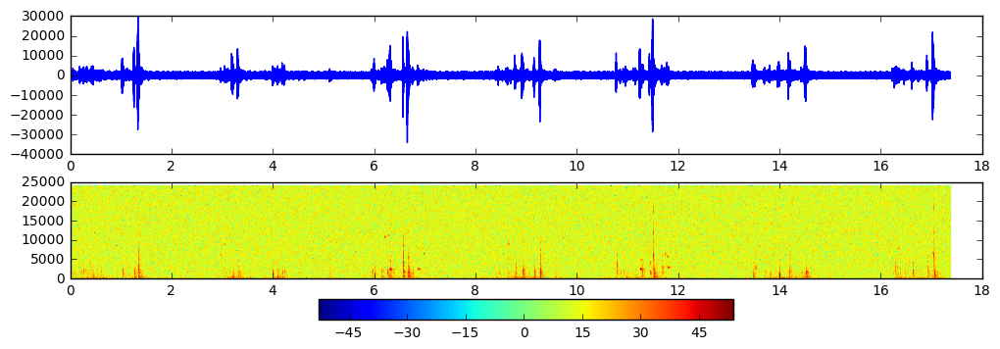

In [77]:
x = data + (np.random.rand(ln)-.5)*P

plot_audio(x)

Audio(x, rate=fs)

### with additive gaussian noise

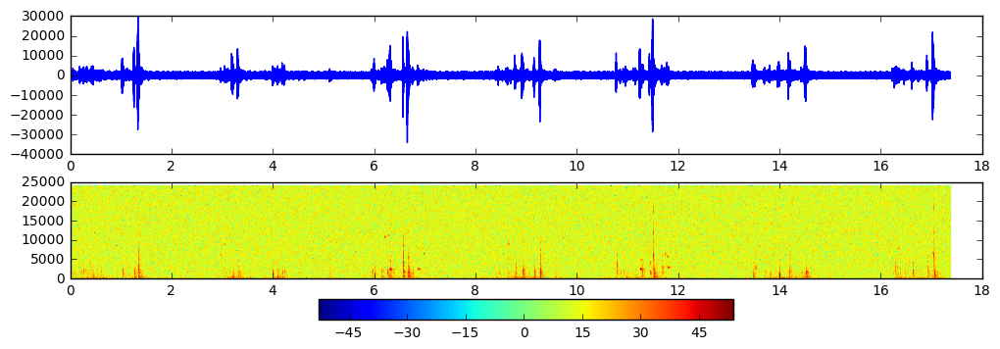

In [84]:
import scipy.stats as stats

x2 = data + stats.norm().rvs(len(data))*P*.5

plot_audio(x)

Audio(x2, rate=fs)

### Let's create an adaptive line enhancer (ALE)

In [85]:
def ALE(x, N, z=1, epsilon=10**-6, mode='NLMS', mu=1):
    # initialize, define vars
    ln = len(x)
    w = np.zeros(N)
    y = np.zeros(x.shape)
    W = []
    # run LMS
    for ptr in xrange(N,ln):
        y[ptr] = x[ptr-N:ptr].dot(w)
        error = x[ptr] - y[ptr]
        # LMS update
        if mode is "LMS":
            w = w + mu*error*x[ptr-N:ptr]
        elif mode is "NLMS":
            w = w + mu*error*x[ptr-N:ptr]/(epsilon+x[ptr-N:ptr].dot(x[ptr-N:ptr]))
        W.append(np.copy(w))
    return y, np.array(W) 

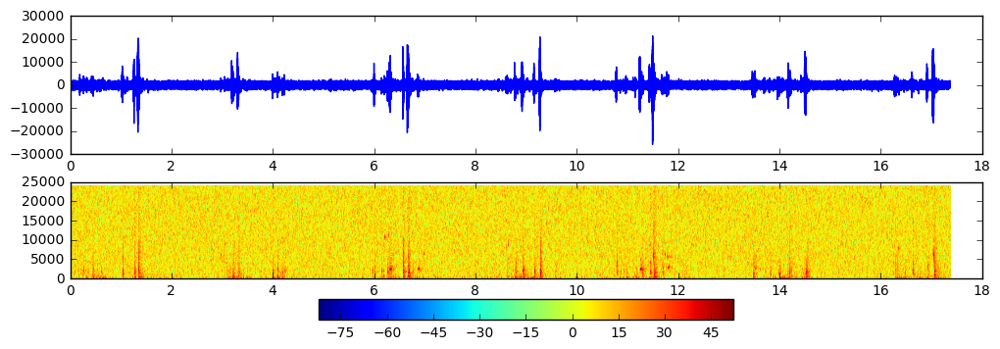

In [86]:
y, W = ALE(x2, 64, mu=.2)  

plot_audio(y)

Audio(y, rate=fs)

#plt.figure(2, figsize=(12,4))

#plt.imshow(W.T, aspect='auto', interpolation="none")#, origin="lower")
#plt.colorbar(orientation='horizontal')

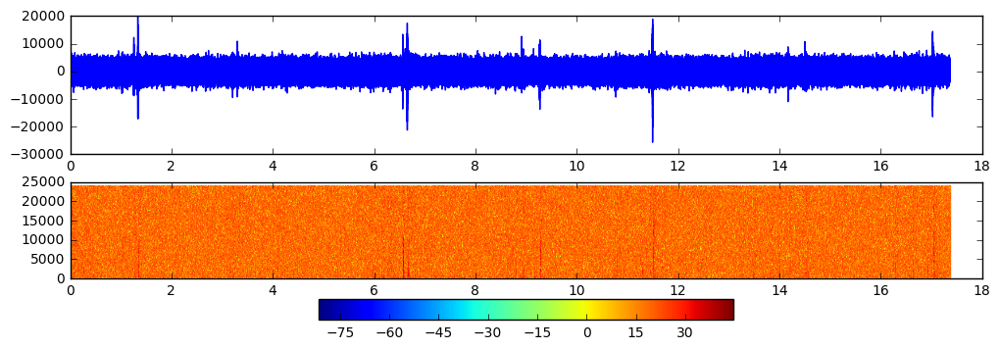

In [87]:
plot_audio(y-x2)
Audio(y-x2, rate=fs)

### Weiner solution

In [22]:
def ALE2(x, N, fs=fs, epsilon=10**-6, delta=1):
    # refine
    x = x[:-delta+1]
    y = x[delta:]
    # autocorrelation
    Ryy = np.zeros((N, N))
    for i in range(N):
        for j in range(N):
            n = abs(i-j)
            if n != 0:
                Ryy[i,j] = y[:-n].dot(y[n:])
            else:
                Ryy[i,j] = y.dot(y)
    # cross correlation
    rxy = np.zeros(N)
    rxy[0] = y.dot(x)
    for i in range(1, N):
        rxy[i] = y[:-i].dot(x[i:])
    # compute
    w = rxy.dot( np.linalg.inv(Ryy+epsilon*np.eye(N)) )
    # filter
    print w
    return sig.lfilter(w, 1, x)

In [24]:
#y = ALE2(x, 16)

#Audio(y, rate=fs)

#plot_audio(y)

### ...try ALE on noisy sine wave instead

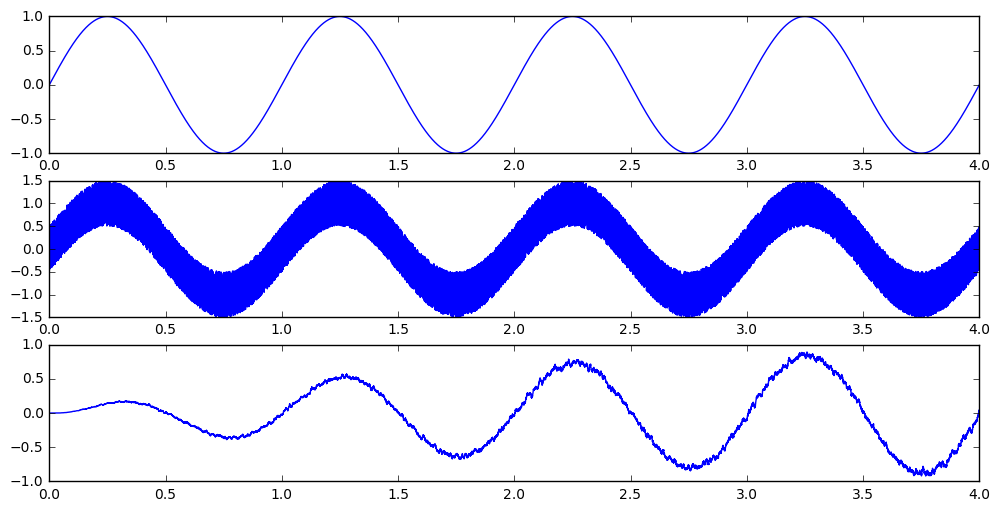

In [25]:
t = np.linspace(0, 4, fs*4)
s = np.sin(2*np.pi*t)

plt.figure(figsize=(12,6))

plt.subplot(3,1,1)
plt.plot(t, s)

# add noise
sn = s + np.random.rand(len(s)) - 0.5

plt.subplot(3,1,2)
plt.plot(t, sn)

# try to remove noise
sh,_ = ALE(sn, 64, mu=.0001)

plt.subplot(3,1,3)
plt.plot(t, sh)

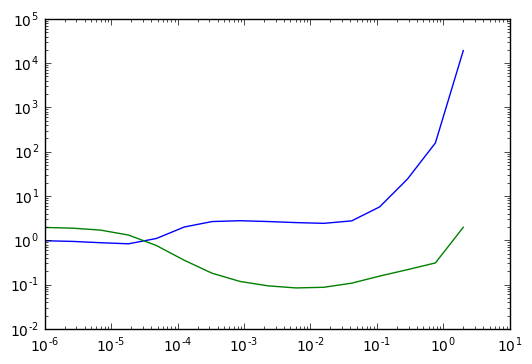

In [26]:
### Let's look at the MSE of various step sizes
epsilon=10**-6
MSE = lambda y,y_hat : np.mean((y-y_hat)**2/(y**2+epsilon))
PDIF = lambda y,y_hat : np.mean(2*(y-y_hat)**2/(y**2+y_hat**2+epsilon))

mus = np.logspace(-6, np.log10(2), 16)

Sf = []
for mu in mus:
    Sf.append(ALE(sn, 64, mu=mu)[0])
    
mse = [MSE(s, sf) for sf in Sf]
pdif = [PDIF(s, sf) for sf in Sf]

plt.loglog(mus, mse)
plt.loglog(mus, pdif)

0.0937846500344
8 0.00229376716208


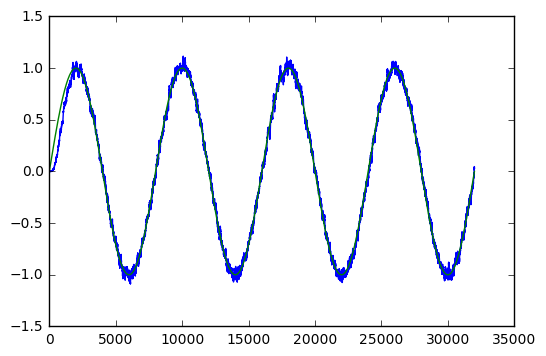

In [27]:
i = 8

plt.plot(Sf[i], label="ALE")
plt.plot(s, label="original")
#plt.plot(MA_filt(sn, 64), label="MA")

PDIF = lambda y,y_hat : np.mean(2*(y-y_hat)**2/(y**2+y_hat**2+epsilon))

print PDIF(s, Sf[i])

print i, mus[i]

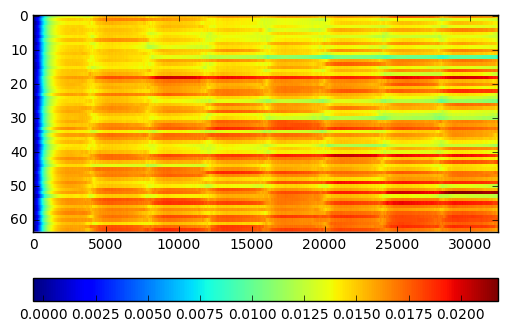

In [28]:
sf, W = ALE(sn, 64, mu=.002)

plt.imshow(W.T, aspect='auto', interpolation='none')
plt.colorbar(orientation='horizontal')

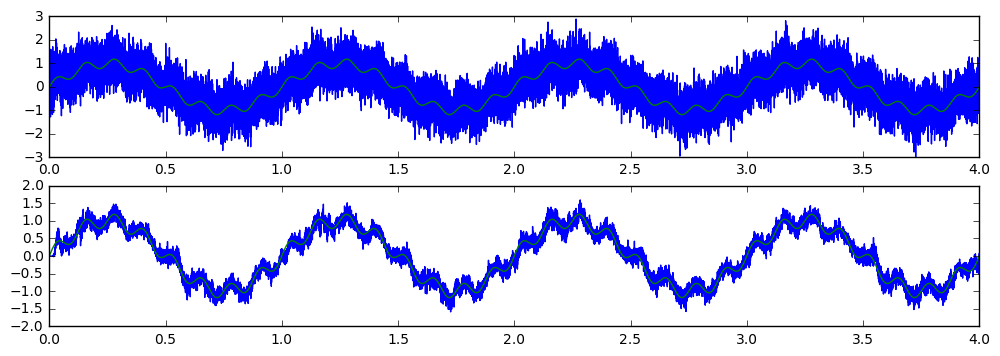

In [50]:
# new data

s2 = np.sin(t*2*np.pi) + .2*np.sin(t*2*np.pi*8)
s2n = s2 + .5*(stats.norm.rvs(size=len(t)))

plt.figure(figsize=(12,4))

plt.subplot(2,1,1)
plt.plot(t, s2n)
plt.plot(t, s2)

# ALE filtering

s2f,_ = ALE(s2n, 128, mu=.1)

plt.subplot(2,1,2)
plt.plot(t, s2f)
plt.plot(t, s2)

In [51]:
Audio(stats.norm.rvs(size=(fs*8)), rate=fs)

### Let's look at the effects of a MA filter

In [90]:
def MA_filt(x, order):
    w = np.ones(order)/order
    return sig.lfilter(w, 1, x)

def MA_filt2(x, order):
    w = np.ones(order)/order
    return np.convolve(x, w, mode='same')

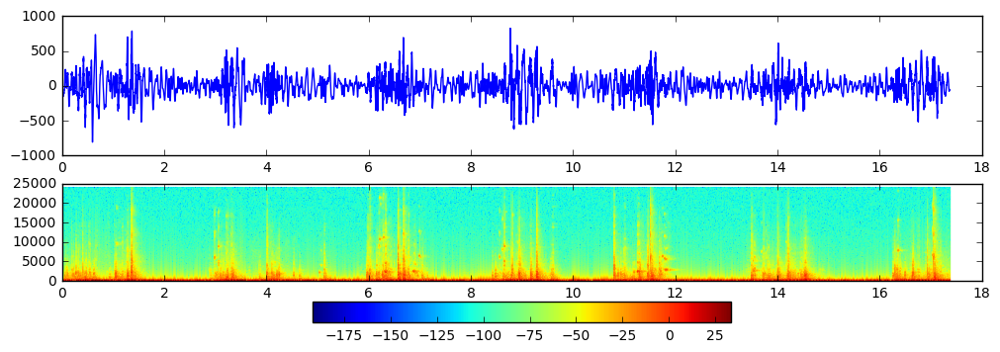

In [91]:
ma = MA_filt(data, 2**10)

plot_audio(ma)

Audio(ma, rate=fs)